Installing Libraries

In [1]:
pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 505 kB/s 


# Task 2: Recommendation Engine - Skeleton Notebook

This notebook provides a very basic example for the notebook you are expected to submit for Task 2 of the Final Project. The main purpose is that we can try different examples to get a better sense of your approach. Compared to Task 1 (Kaggle Competition), we don't have any objective means to evaluate the recommendations. 

Some general comments:
* You can import any data you need. This particularly includes your cleaned version of the properties dataset (incl. the auxiliary data or any other data you might have collected); there's no need to show the data cleaning / preprocessing steps in this notebook.
* You can also import your code in form of external Python (.py) script. You're actually encouraged to do so to keep this notebook light and uncluttered.
* **Important:** Please consider this notebook as an example and not to set specific requirements. Your notebook is likely to look very different. As long there is a section where we can easily test your solution, it should be fine.

In [2]:
from scipy.spatial import distance

import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

Reading in data

In [3]:
df=pd.read_csv('/content/sg-property-prices-simplified.csv')
df.head()

,listing_id,title,property_name,property_type,built_year,num_beds,num_baths,size_sqft,planning_area,price
0,799762,hdb flat for sale in 524 ang mo kio avenue 5,hdb-ang mo kio,hdb 3 rooms,1980.0,2.0,2.0,732,ang mo kio,419000.0
1,896907,4 bed condo for sale in kopar at newton,kopar at newton,condo,2023.0,4.0,4.0,1528,novena,3727500.0
2,445021,4 bed condo for sale in nouvel 18,nouvel 18,condo,2014.0,4.0,3.0,2476,newton,8013600.0
3,252293,hdb flat for sale in 467 jurong west street 41,hong kah ville,hdb,1985.0,3.0,2.0,1302,jurong west,682500.0
4,926453,hdb flat for sale in 664b punggol drive,waterway sunbeam,Hdb 5 Rooms,2016.0,3.0,2.0,1184,punggol,764400.0


In [5]:
# Pick a row id of choice
row_id = 10
#row_id = 20
#row_id = 30
#row_id = 40
#row_id = 50

# Get the row from the dataframe (an valid row ids will throw an error)
row = df.iloc[row_id]

# Just for printing it nicely, we create a new dataframe from this single row
pd.DataFrame([row])

,listing_id,title,property_name,property_type,built_year,num_beds,num_baths,size_sqft,planning_area,price
10,954673,5 bed house for sale in pasir ris beach park,pasir ris beach park,bungalow,1977.0,5.0,6.0,7534,pasir ris,9030000.0


In [10]:
dfnum=df[['num_beds','num_baths','size_sqft','price']]

Categorical encoding

In [44]:
dftar=df[['title','property_name','property_type','planning_area']]
dftarenc=pd.get_dummies(dftar)

In [45]:
dataframes=[dfnum,dftarenc]
dfencoding=pd.concat(dataframes,axis=1)

Scaling so as to equally weight each variables
This is a design choice
One might for instance prefer to give more importance to some or the other variables

In [46]:
from sklearn.preprocessing import StandardScaler 
transformer = StandardScaler().fit(dfencoding)

dfnext=transformer.fit_transform(dfencoding)

In [47]:

dfnext25=pd.DataFrame(dfnext).dropna()

           0          1          2          3          4          5     \
0      0.000000  52.417680  67.459246  80.818754  81.631256  69.397474   
1     52.417680   0.000000  49.493097  66.682318  67.664969  52.223784   
2     67.459246  49.493097   0.000000  79.051949  79.882754  67.294522   
3     80.818754  66.682318  79.051949   0.000000  91.454919  80.715544   
4     81.631256  67.664969  79.882754  91.454919   0.000000  81.529157   
...         ...        ...        ...        ...        ...        ...   
1974  72.078305  55.793823  70.114901  83.048093  83.839021  71.981606   
1975  76.427230  61.302734  74.565043  86.842087  87.598806  76.318835   
1976  80.883569  66.760523  79.117551  90.787994  91.512214  80.780159   
1977  63.037503  43.250720  60.587613  75.313210  76.184979  62.861205   
1978  53.626590  28.740312  51.276203  68.021316  68.984909  53.913566   

           6          7          8          9     ...       1969       1970  \
0     67.157690  54.472251  80.7

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


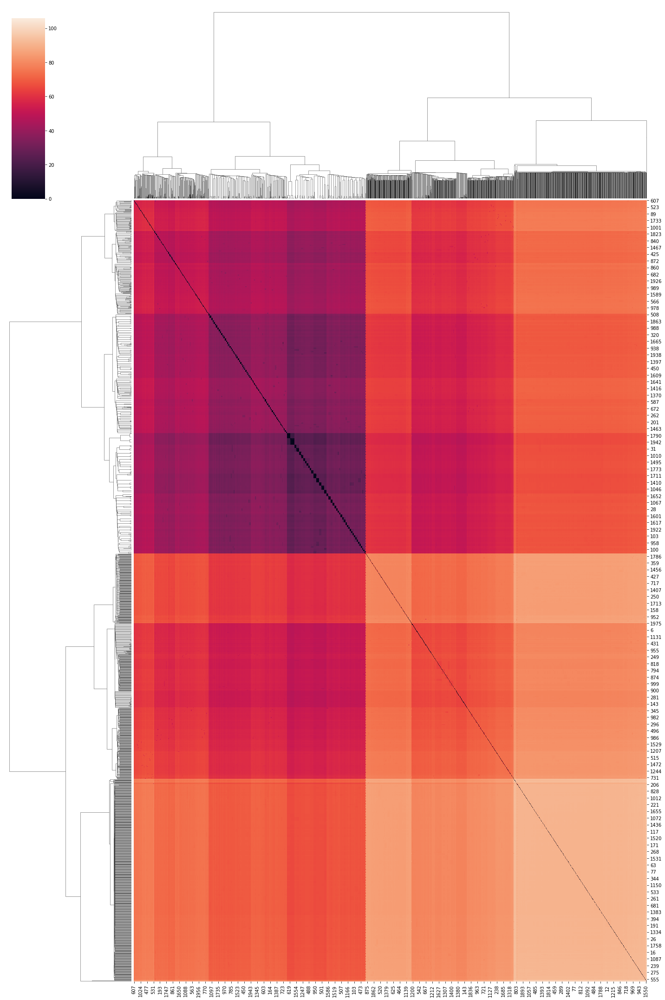

In [48]:
#euclidean
deuclidean=distance.cdist(dfnext25,dfnext25, metric='euclidean')
dmateuclidean=pd.DataFrame(deuclidean)
print(dmateuclidean)
figeuclidean=sns.clustermap(dmateuclidean,figsize=(20, 30))

The get_top_knn_recommendations() implementation

This is the first of two implementations and uses a traditional knn approach

In [67]:
from sklearn.neighbors import NearestNeighbors
import numpy as np

#Takes row index as input

def get_top_knn_recommendations(x,k):
  nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(dfnext25)
  distances, indices = nbrs.kneighbors(dfnext25.iloc[[x]])
  return indices

Displays nearest neighbors

In [68]:
nearestneighborindices=get_top_knn_recommendations(row_id,5)

for i in range(len(nearestneighborindices[0])):
  print(df.iloc[nearestneighborindices[0][i]])

listing_id                                           942099
title            hdb flat for sale in 275a bishan street 24
property_name                                   natura loft
property_type                                   hdb 4 rooms
built_year                                           2011.0
num_beds                                                3.0
num_baths                                               2.0
size_sqft                                              1022
planning_area                                        bishan
price                                              945000.0
Name: 20, dtype: object
listing_id                                     641239
title            2 bed condo for sale in tropika east
property_name                            tropika east
property_type                                   condo
built_year                                     2016.0
num_beds                                          2.0
num_baths                                         2.

9 machine learning similarity metrics from the literature are implemented here


The get_top_recommendations function


In [63]:
def get_top_recommendations(row,k,dmat):
  result=[]
  finres=[]
  rslt_df = dmat.sort_values(by = [row-1])

  rt=rslt_df.iloc[:k,:]
  rt2=rt.index
  for i in range(k):
    result.append(rt2[i])
    finres.append(df.iloc[i])

  return pd.DataFrame(finres)

Testing implementation

In [64]:
#Choose k and row_id
row_id = 20
k = 3

#Choose the distance matrix among 
#dmateuclidean,dmatbraycurtis,dmatcanberra,dmatchebyshev,dmatcityblock,dmatcorrelation,dmatcorrelation,dmatminkowski,dmatseuclidean

df_recommendations = get_top_recommendations(row_id, k,dmateuclidean)
df_recommendations

,listing_id,title,property_name,property_type,built_year,num_beds,num_baths,size_sqft,planning_area,price
0,799762,hdb flat for sale in 524 ang mo kio avenue 5,hdb-ang mo kio,hdb 3 rooms,1980.0,2.0,2.0,732,ang mo kio,419000.0
1,896907,4 bed condo for sale in kopar at newton,kopar at newton,condo,2023.0,4.0,4.0,1528,novena,3727500.0
2,445021,4 bed condo for sale in nouvel 18,nouvel 18,condo,2014.0,4.0,3.0,2476,newton,8013600.0


Apart from euclidean other distance matrices are created below

          0         1         2         3         4         5         6     \
0     0.000000  0.453898  0.543341  0.559898  0.569230  0.523482  0.542121   
1     0.453898  0.000000  0.426310  0.505431  0.518582  0.437349  0.441453   
2     0.543341  0.426310  0.000000  0.578342  0.587629  0.527499  0.525440   
3     0.559898  0.505431  0.578342  0.000000  0.602028  0.561611  0.576302   
4     0.569230  0.518582  0.587629  0.602028  0.000000  0.571290  0.585576   
...        ...       ...       ...       ...       ...       ...       ...   
1974  0.527663  0.475168  0.558229  0.572838  0.581514  0.539081  0.556837   
1975  0.560099  0.509792  0.580229  0.594931  0.602480  0.563004  0.580104   
1976  0.561229  0.507331  0.579338  0.595028  0.602830  0.562816  0.577305   
1977  0.522496  0.387927  0.482479  0.560918  0.571164  0.505594  0.497103   
1978  0.427737  0.316172  0.445403  0.518794  0.531097  0.456019  0.453901   

          7         8         9     ...      1969      1970    

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


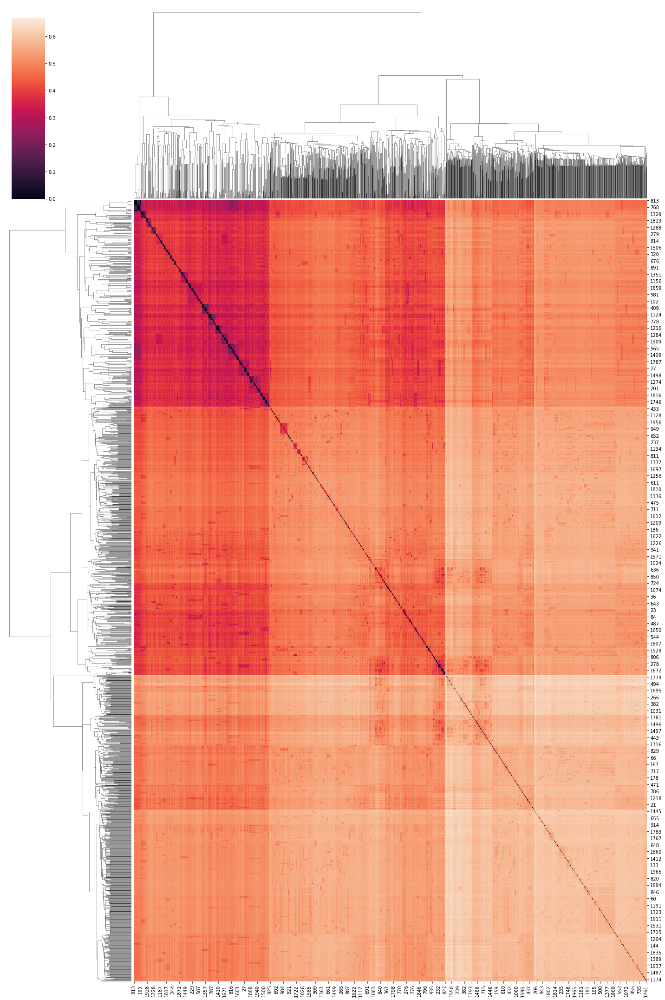

In [53]:
#braycurtis
dbraycurtis=distance.cdist(dfnext25,dfnext25, metric='braycurtis')
dmatbraycurtis=pd.DataFrame(dbraycurtis)
print(dmatbraycurtis)
figbraycurtis=sns.clustermap(dmatbraycurtis,figsize=(20, 30))

           0          1          2          3          4          5     \
0      0.000000  11.761262  12.000000   9.357858   9.253985  10.486827   
1     11.761262   0.000000   8.279755  11.475157  11.579483   9.535587   
2     12.000000   8.279755   0.000000  12.000000  12.000000  10.757251   
3      9.357858  11.475157  12.000000   0.000000   8.163153  10.049354   
4      9.253985  11.579483  12.000000   8.163153   0.000000  10.191957   
...         ...        ...        ...        ...        ...        ...   
1974   8.046780  11.748515  12.000000   9.350937   9.244256  10.463887   
1975   9.492343  11.703395  12.000000   8.801019   8.662698  10.831916   
1976   9.359668  11.508242  12.000000   8.081181   8.119372  10.092773   
1977  12.000000   7.693592   6.776258  12.000000  12.000000  10.741919   
1978   9.676295   7.025865   8.814890  11.327259  11.450024  10.054333   

           6          7          8          9     ...       1969       1970  \
0     12.000000  12.000000   9.0

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


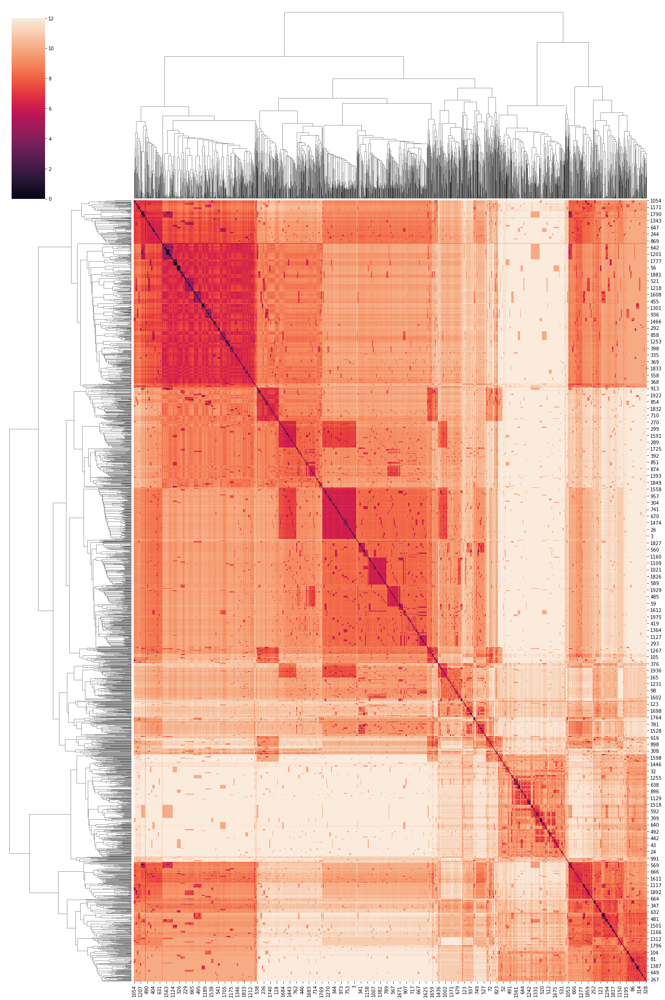

In [54]:
#canberra
dcanberra=distance.cdist(dfnext25,dfnext25, metric='canberra')
dmatcanberra=pd.DataFrame(dcanberra)
print(dmatcanberra)
figcanberra=sns.clustermap(dmatcanberra,figsize=(20, 30))

           0          1          2          3          4          5     \
0      0.000000  45.011115  45.011115  45.011115  45.011115  45.011115   
1     45.011115   0.000000  31.835530  45.011115  45.011115  45.011115   
2     45.011115  31.835530   0.000000  45.011115  45.011115  45.011115   
3     45.011115  45.011115  45.011115   0.000000  45.011115  45.011115   
4     45.011115  45.011115  45.011115  45.011115   0.000000  45.011115   
...         ...        ...        ...        ...        ...        ...   
1974  45.011115  45.011115  45.011115  45.011115  45.011115  45.011115   
1975  45.011115  45.011115  45.011115  45.011115  45.011115  45.011115   
1976  45.011115  45.011115  45.011115  45.011115  45.011115  45.011115   
1977  45.011115  31.835530  31.835530  45.011115  45.011115  45.011115   
1978  45.011115  17.037875  31.835530  45.011115  45.011115  45.011115   

           6          7          8          9     ...       1969       1970  \
0     45.011115  45.011115  45.0

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


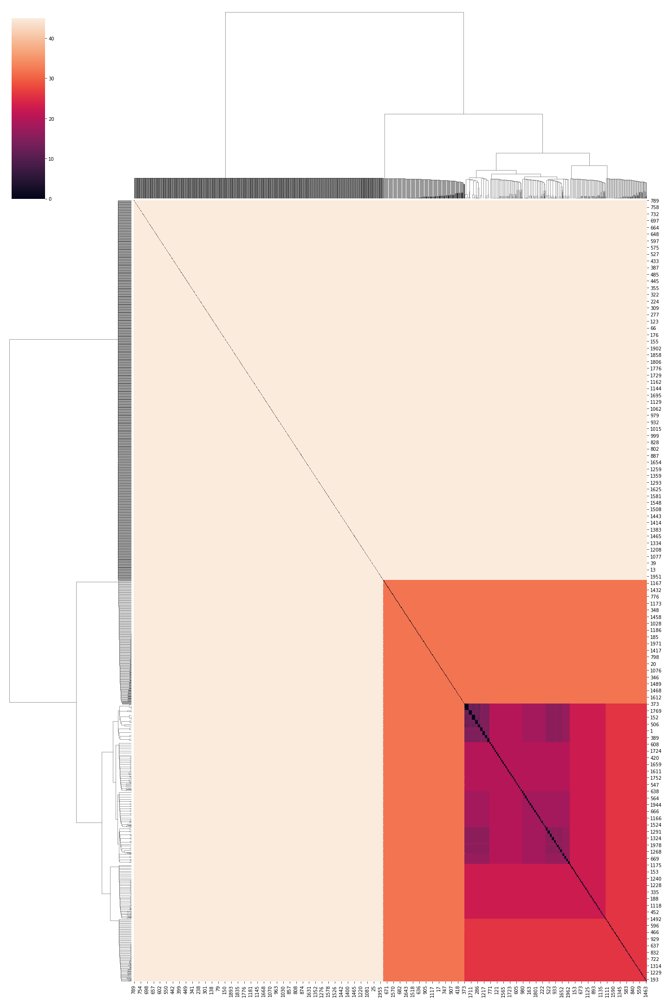

In [55]:
#chebyshev
dchebyshev=distance.cdist(dfnext25,dfnext25, metric='chebyshev')
dmatchebyshev=pd.DataFrame(dchebyshev)
print(dmatchebyshev)
figchebyshev=sns.clustermap(dmatchebyshev,figsize=(20, 30))

            0           1           2           3           4           5     \
0       0.000000  108.029040  154.069122  175.110662  183.369998  147.590286   
1     108.029040    0.000000  104.148396  133.923241  142.273001  103.420444   
2     154.069122  104.148396    0.000000  179.963323  188.313082  149.460526   
3     175.110662  133.923241  179.963323    0.000000  209.394009  173.484487   
4     183.369998  142.273001  188.313082  209.394009    0.000000  181.834246   
...          ...         ...         ...         ...         ...         ...   
1974  156.963189  118.028716  164.068797  185.110337  193.369673  157.589961   
1975  177.210014  136.400552  182.440634  203.506845  211.741510  175.961798   
1976  176.853047  135.625086  181.665167  202.782451  211.097007  175.186331   
1977  140.691871   89.397673  133.874760  166.586072  174.935831  136.083275   
1978  105.750594   65.121707  112.535261  141.974075  150.323834  111.673261   

            6           7           8  

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


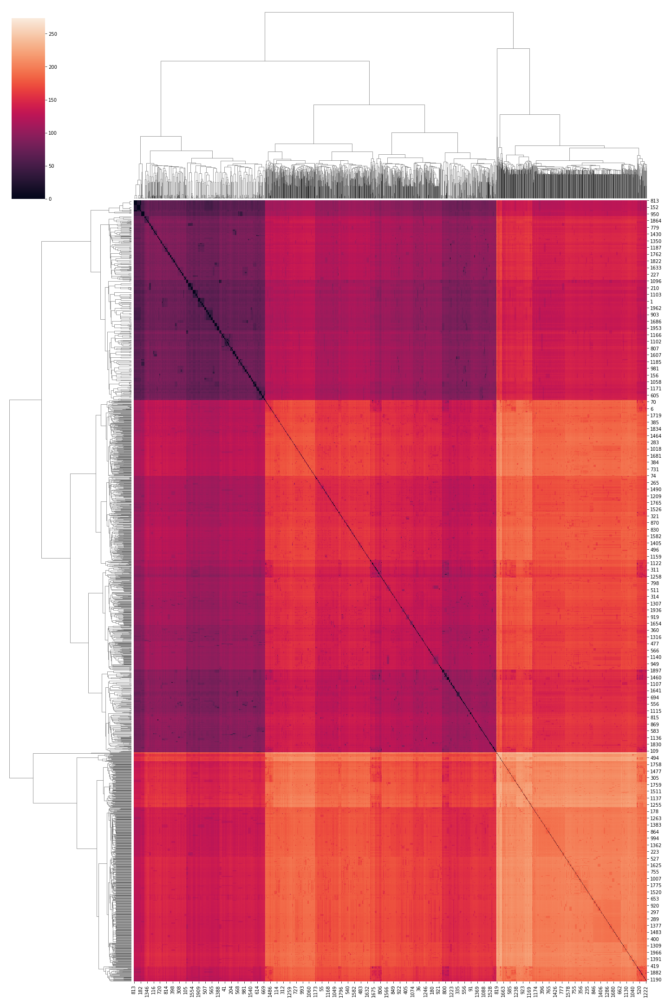

In [56]:
#cityblock
dcityblock=distance.cdist(dfnext25,dfnext25, metric='cityblock')
dmatcityblock=pd.DataFrame(dcityblock)
print(dmatcityblock)
figcityblock=sns.clustermap(dmatcityblock,figsize=(20, 30))

          0         1         2         3         4         5         6     \
0     0.000000  1.006288  1.002694  1.001043  1.000985  1.001810  1.003084   
1     1.006288  0.000000  0.999702  1.003978  1.003686  1.004963  1.002827   
2     1.002694  0.999702  0.000000  1.001860  1.001804  1.001761  1.000630   
3     1.001043  1.003978  1.001860  0.000000  1.000926  1.001252  1.001814   
4     1.000985  1.003686  1.001804  1.000926  0.000000  1.001193  1.001793   
...        ...       ...       ...       ...       ...       ...       ...   
1974  1.000899  1.005652  1.002519  1.001002  1.000959  1.001681  1.002864   
1975  1.000965  1.004831  1.002088  1.000916  1.000897  1.001213  1.002321   
1976  1.001017  1.003857  1.001815  1.000928  1.000913  1.001218  1.001783   
1977  1.003345  0.999146  0.999097  1.002234  1.002153  1.002252  1.000207   
1978  0.981341  0.998623  0.999416  1.003229  1.003016  1.003476  1.001306   

          7         8         9     ...      1969      1970    

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


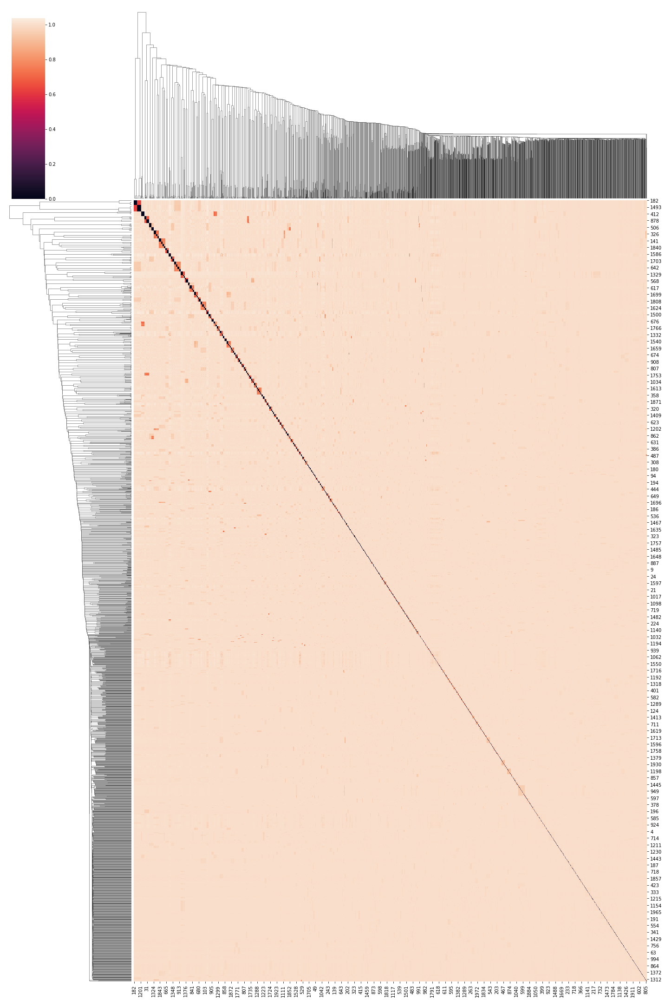

In [57]:
#correlation
dcorrelation=distance.cdist(dfnext25,dfnext25, metric='correlation')
dmatcorrelation=pd.DataFrame(dcorrelation)
print(dmatcorrelation)
figcorrelation=sns.clustermap(dmatcorrelation,figsize=(20, 30))

          0         1             2         3         4         5     \
0     0.000000  1.006309  1.002691e+00  1.001037  1.000977  1.001809   
1     1.006309  0.000000  9.998790e-01  1.004414  1.004236  1.004998   
2     1.002691  0.999879  2.220446e-16  1.001821  1.001754  1.001758   
3     1.001037  1.004414  1.001821e+00  0.000000  1.000803  1.001243   
4     1.000977  1.004236  1.001754e+00  1.000803  0.000000  1.001182   
...        ...       ...           ...       ...       ...       ...   
1974  1.000897  1.005853  1.002500e+00  1.000956  1.000901  1.001677   
1975  1.000958  1.005321  1.002043e+00  1.000806  1.000758  1.001203   
1976  1.001010  1.004318  1.001773e+00  1.000825  1.000783  1.001208   
1977  1.003347  0.999030  9.991072e-01  1.002260  1.002186  1.002254   
1978  0.981365  0.997374  9.995273e-01  1.003505  1.003364  1.003500   

          6         7         8         9     ...      1969      1970  \
0     1.003082  1.008275  1.000985  0.990812  ...  1.002896  1

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


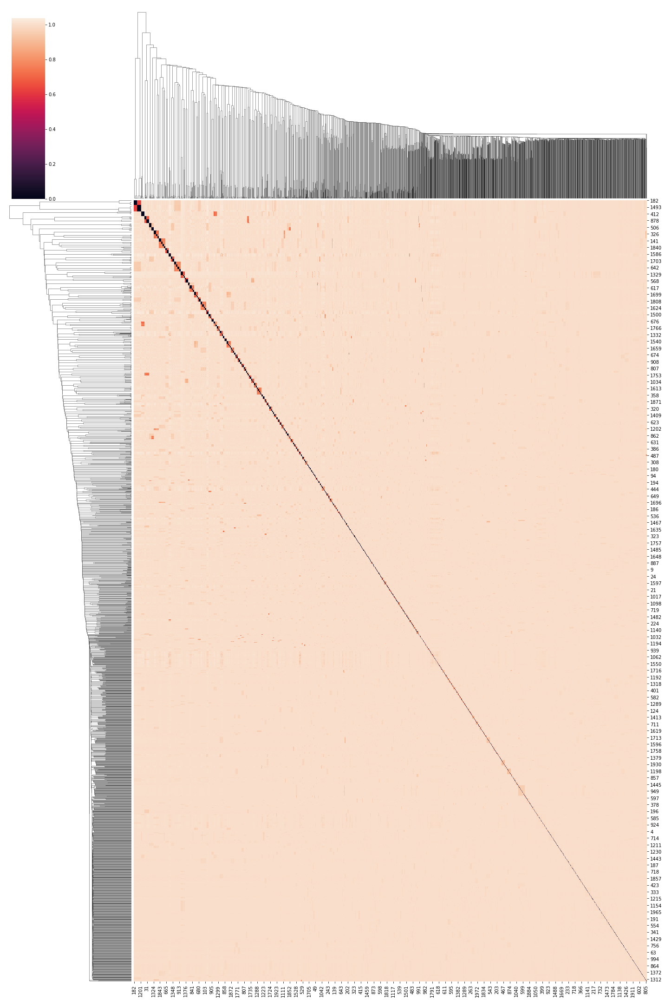

In [58]:
#cosine
dcosine=distance.cdist(dfnext25,dfnext25, metric='cosine')
dmatcosine=pd.DataFrame(dcosine)
print(dmatcosine)
figcosine=sns.clustermap(dmatcorrelation,figsize=(20, 30))

           0          1          2          3          4          5     \
0      0.000000  52.417680  67.459246  80.818754  81.631256  69.397474   
1     52.417680   0.000000  49.493097  66.682318  67.664969  52.223784   
2     67.459246  49.493097   0.000000  79.051949  79.882754  67.294522   
3     80.818754  66.682318  79.051949   0.000000  91.454919  80.715544   
4     81.631256  67.664969  79.882754  91.454919   0.000000  81.529157   
...         ...        ...        ...        ...        ...        ...   
1974  72.078305  55.793823  70.114901  83.048093  83.839021  71.981606   
1975  76.427230  61.302734  74.565043  86.842087  87.598806  76.318835   
1976  80.883569  66.760523  79.117551  90.787994  91.512214  80.780159   
1977  63.037503  43.250720  60.587613  75.313210  76.184979  62.861205   
1978  53.626590  28.740312  51.276203  68.021316  68.984909  53.913566   

           6          7          8          9     ...       1969       1970  \
0     67.157690  54.472251  80.7

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


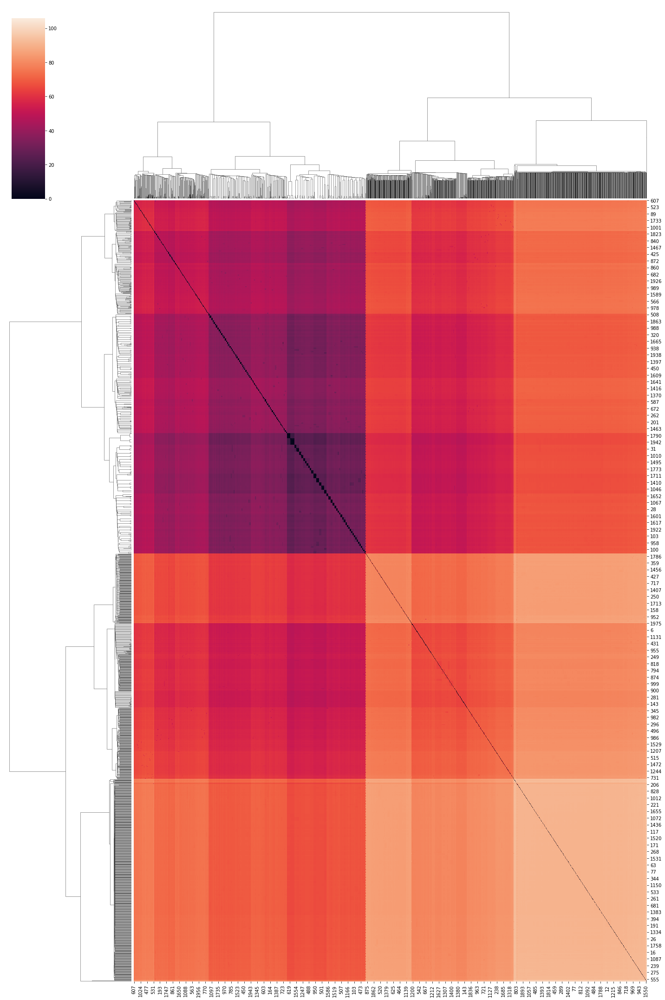

In [60]:
#minkowski
dminkowski=distance.cdist(dfnext25,dfnext25, metric='minkowski')
dmatminkowski=pd.DataFrame(dminkowski)
print(dmatminkowski)
figminkowski=sns.clustermap(dmatminkowski,figsize=(20, 30))

           0          1          2          3          4          5     \
0      0.000000  51.825324  66.690136  79.893111  80.695902  68.611273   
1     51.825324   0.000000  48.923139  65.915039  66.885999  51.632203   
2     66.690136  48.923139   0.000000  78.141236  78.962169  66.526108   
3     79.893111  65.915039  78.141236   0.000000  90.400030  79.790382   
4     80.695902  66.885999  78.962169  90.400030   0.000000  80.594277   
...         ...        ...        ...        ...        ...        ...   
1974  71.254183  55.152734  69.307615  82.090480  82.872014  71.158072   
1975  75.552540  60.597936  73.706232  85.840596  86.588329  75.444649   
1976  79.991018  66.033341  78.240680  89.771199  90.486582  79.888134   
1977  62.332374  42.770382  59.901612  74.456008  75.317301  62.156856   
1978  55.583759  32.978842  53.380279  69.292564  70.216847  55.870727   

           6          7          8          9     ...       1969       1970  \
0     66.398925  53.862897  79.8

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:625: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


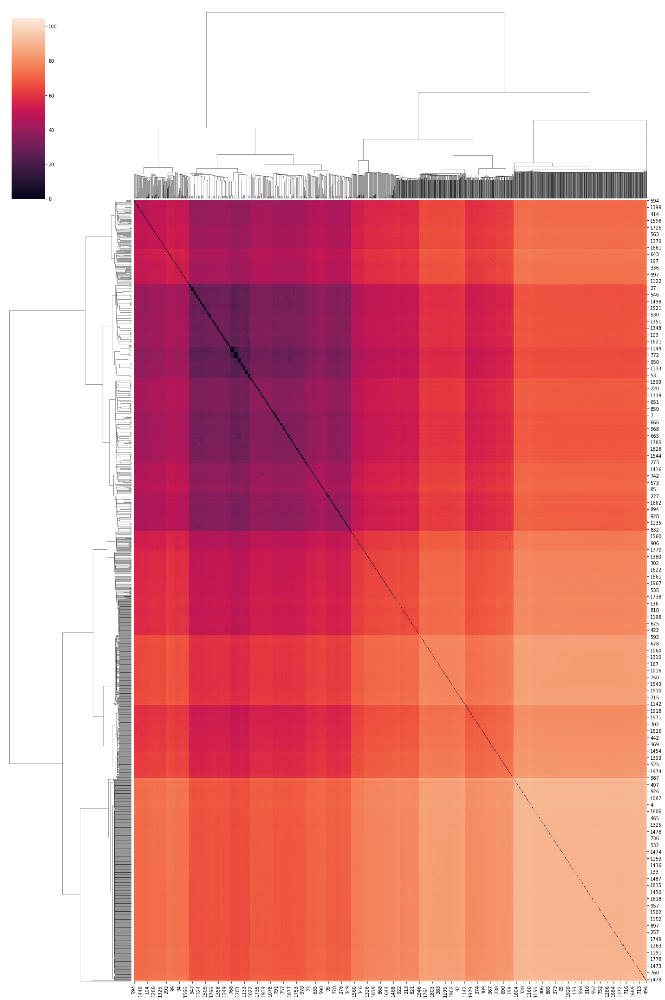

In [61]:
#seuclidean
dseuclidean=distance.cdist(dfnext25,dfnext25, metric='seuclidean')
dmatseuclidean=pd.DataFrame(dseuclidean)
print(dmatseuclidean)
figseuclidean=sns.clustermap(dmatseuclidean,figsize=(20, 30))